# Навигатор
* [1. Подключение необходимых библиотек и скриптов](#lib)
* [2. Загрузка данных](#load)
* [3. EDA](#eda)
    * [3.1. Исследование целевой переменной](#eda_target)
    * [3.2. Первичный анализ данных с помощью Pandas Profile Report](#eda_report)
    * [3.3. Проверка похожести признаков Train и Test](#eda_train_test)
* [4. Обработка выбросов и пропусков](#out_nan)
    * [4.1. Вещественные признаки](#out_nan_def)
    * [4.2. Категориальные признаки](#out_nan_mat)
* [5. Генерация признаков](#feature_eng)
* [6. Классы подготовки данных](#data_prepare)
* [7. Разбиение на train и test](#split)
* [8. Построение модели](#modeling)
* [9. Прогнозирование на тестовом датасете](#prediction)

## 1. Подключение необходимых библиотек и скриптов <a class='anchor' id='lib'>

In [1]:
import pandas as pd
import numpy as np
import pickle

from sklearn.model_selection import train_test_split, ShuffleSplit, cross_val_score, learning_curve
from sklearn.metrics import classification_report, f1_score, precision_score, recall_score
from sklearn.model_selection import KFold, GridSearchCV, RandomizedSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier

import xgboost as xgb, lightgbm as lgbm, catboost as catb
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor

import seaborn as sns
from matplotlib import pyplot as plt

from pandas_profiling import ProfileReport
from scipy.stats import mannwhitneyu
%matplotlib inline

In [2]:
import warnings
warnings.simplefilter('ignore')

In [3]:
def get_classification_report(y_train_true, y_train_pred, y_test_true, y_test_pred):
    report = {'train_report': classification_report(y_train_true, y_train_pred), 
              'test_report':classification_report(y_test_true, y_test_pred),
              'crosstab': pd.crosstab(y_test_true, y_test_pred)}
    return report

In [4]:
def reduce_mem_usage(df):
    start_mem = df.memory_usage().sum() / 1024**2
    print('Memory usage of dataframe is {:.2f} MB'.format(start_mem))
    
    for col in df.columns:
        col_type = df[col].dtype
        
        if col_type != object:
            c_min = df[col].min()
            c_max = df[col].max()
            if str(col_type)[:3] == 'int':
                if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                    df[col] = df[col].astype(np.int8)
                elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                    df[col] = df[col].astype(np.int16)
                elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                    df[col] = df[col].astype(np.int32)
                elif c_min > np.iinfo(np.int64).min and c_max < np.iinfo(np.int64).max:
                    df[col] = df[col].astype(np.int64)  
            else:
                if c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                    df[col] = df[col].astype(np.float32)
                else:
                    df[col] = df[col].astype(np.float64)
        else:
            df[col] = df[col].astype('category')

    end_mem = df.memory_usage().sum() / 1024**2
    print('Memory usage after optimization is: {:.2f} MB'.format(end_mem))
    print('Decreased by {:.1f}%'.format(100 * (start_mem - end_mem) / start_mem))
    
    return df

In [5]:
def evaluate_preds(model, X_train, X_valid, y_train, y_valid):   
    y_train_pred = model.predict(X_train)
    y_valid_pred = model.predict(X_valid)
    print("TRAIN\n", round(f1_score(y_train, y_train_pred), 3))
    print("VALID\n", round(f1_score(y_valid, y_valid_pred), 3))
    get_classification_report(y_train, y_train_pred, y_valid, y_valid_pred)
    
def get_classification_report(y_train_true, y_train_pred, y_valid_true, y_valid_pred):
    print('TRAIN\n\n' + classification_report(y_train_true, y_train_pred))
    print('VALID\n\n' + classification_report(y_valid_true, y_valid_pred))
    print('CONFUSION MATRIX\n')
    print(pd.crosstab(y_valid_true, y_valid_pred))

## Пути к директориям и файлам

In [6]:
TRAIN_DATASET_PATH = '/kaggle/input/gb-credit-default/train.csv'
TEST_DATASET_PATH = '/kaggle/input/gb-credit-default/test.csv'

## 2. Загрузка данных

Описание датасета

* **Home Ownership** - домовладение
* **Annual Income** - годовой доход
* **Years in current job** - количество лет на текущем месте работы
* **Tax Liens** - налоговые обременения
* **Number of Open Accounts** - количество открытых счетов
* **Years of Credit History** - количество лет кредитной истории
* **Maximum Open Credit** - наибольший открытый кредит (максимальная сумма, которая когда-либо была доступна клиенту)
* **Number of Credit Problems** - количество проблем с кредитом
* **Months since last delinquent** - количество месяцев с последней просрочки платежа
* **Bankruptcies** - банкротства
* **Purpose** - цель кредита
* **Term** - срок кредита
* **Current Loan Amount** - текущая сумма кредита (сумма, которую еще предстоит выплатить клиенту)
* **Current Credit Balance** - текущий кредитный баланс (сумма, которую может тратить клиент с кредитного счета)
* **Monthly Debt** - ежемесячный долг
* **Credit Score** - баллы кредитного рейтинга
* **Credit Default** - факт невыполнения кредитных обязательств (0 - погашен вовремя, 1 - просрочка)

In [7]:
train_df = pd.read_csv(TRAIN_DATASET_PATH)
train_df

,Home Ownership,Annual Income,Years in current job,Tax Liens,Number of Open Accounts,Years of Credit History,Maximum Open Credit,Number of Credit Problems,Months since last delinquent,Bankruptcies,Purpose,Term,Current Loan Amount,Current Credit Balance,Monthly Debt,Credit Score,Credit Default
0,Own Home,482087.0,NaN,0.0,11.0,26.3,685960.0,1.0,NaN,1.0,debt consolidation,Short Term,99999999.0,47386.0,7914.0,749.0,0
1,Own Home,1025487.0,10+ years,0.0,15.0,15.3,1181730.0,0.0,NaN,0.0,debt consolidation,Long Term,264968.0,394972.0,18373.0,737.0,1
2,Home Mortgage,751412.0,8 years,0.0,11.0,35.0,1182434.0,0.0,NaN,0.0,debt consolidation,Short Term,99999999.0,308389.0,13651.0,742.0,0
3,Own Home,805068.0,6 years,0.0,8.0,22.5,147400.0,1.0,NaN,1.0,debt consolidation,Short Term,121396.0,95855.0,11338.0,694.0,0
4,Rent,776264.0,8 years,0.0,13.0,13.6,385836.0,1.0,NaN,0.0,debt consolidation,Short Term,125840.0,93309.0,7180.0,719.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7495,Rent,402192.0,< 1 year,0.0,3.0,8.5,107866.0,0.0,NaN,0.0,other,Short Term,129360.0,73492.0,1900.0,697.0,0
7496,Home Mortgage,1533984.0,1 year,0.0,10.0,26.5,686312.0,0.0,43.0,0.0,debt consolidation,Long Term,444048.0,456399.0,12783.0,7410.0,1
7497,Rent,1878910.0,6 years,0.0,12.0,32.1,1778920.0,0.0,NaN,0.0,buy a car,Short Term,99999999.0,477812.0,12479.0,748.0,0
7498,Home Mortgage,NaN,NaN,0.0,21.0,26.5,1141250.0,0.0,NaN,0.0,debt consolidation,Short Term,615274.0,476064.0,37118.0,NaN,0


In [8]:
train_df.dtypes

Home Ownership                   object
Annual Income                   float64
Years in current job             object
Tax Liens                       float64
Number of Open Accounts         float64
Years of Credit History         float64
Maximum Open Credit             float64
Number of Credit Problems       float64
Months since last delinquent    float64
Bankruptcies                    float64
Purpose                          object
Term                             object
Current Loan Amount             float64
Current Credit Balance          float64
Monthly Debt                    float64
Credit Score                    float64
Credit Default                    int64
dtype: object

## 3. EDA <a class='anchor' id='eda'>

### 3.1 Исследование целевой переменной <a class='anchor' id='eda_target'>

In [9]:
TARGET_NAME = 'Credit Default'
train_df[TARGET_NAME].value_counts()

0    5387
1    2113
Name: Credit Default, dtype: int64

Сразу видим дисбаланс классов.

### 3.2 Первичный анализ данных с помощью Pandas Profile Report <a class='anchor' id='eda_report'>

In [10]:
train_profile = ProfileReport(train_df, title='Pandas Profile Report')
train_profile

Summarize dataset:   0%|          | 0/31 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### 3.3 Проверка похожести признаков Train и Test <a class='anchor' id='eda_train_test'>

#### Загрузим тестовый датасет

In [11]:
test_df = pd.read_csv(TEST_DATASET_PATH)
test_df

,Home Ownership,Annual Income,Years in current job,Tax Liens,Number of Open Accounts,Years of Credit History,Maximum Open Credit,Number of Credit Problems,Months since last delinquent,Bankruptcies,Purpose,Term,Current Loan Amount,Current Credit Balance,Monthly Debt,Credit Score
0,Rent,NaN,4 years,0.0,9.0,12.5,220968.0,0.0,70.0,0.0,debt consolidation,Short Term,162470.0,105906.0,6813.0,NaN
1,Rent,231838.0,1 year,0.0,6.0,32.7,55946.0,0.0,8.0,0.0,educational expenses,Short Term,78298.0,46037.0,2318.0,699.0
2,Home Mortgage,1152540.0,3 years,0.0,10.0,13.7,204600.0,0.0,NaN,0.0,debt consolidation,Short Term,200178.0,146490.0,18729.0,7260.0
3,Home Mortgage,1220313.0,10+ years,0.0,16.0,17.0,456302.0,0.0,70.0,0.0,debt consolidation,Short Term,217382.0,213199.0,27559.0,739.0
4,Home Mortgage,2340952.0,6 years,0.0,11.0,23.6,1207272.0,0.0,NaN,0.0,debt consolidation,Long Term,777634.0,425391.0,42605.0,706.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,Home Mortgage,1020053.0,10+ years,0.0,14.0,29.1,559152.0,1.0,68.0,1.0,debt consolidation,Short Term,99999999.0,162735.0,15046.0,745.0
2496,Home Mortgage,NaN,2 years,0.0,15.0,17.0,1737780.0,0.0,77.0,0.0,debt consolidation,Short Term,468512.0,1439269.0,32996.0,NaN
2497,Home Mortgage,1171806.0,2 years,0.0,48.0,12.8,1706430.0,0.0,NaN,0.0,debt consolidation,Short Term,430496.0,676438.0,36912.0,695.0
2498,Rent,723520.0,10+ years,0.0,14.0,28.8,945780.0,0.0,NaN,0.0,debt consolidation,Short Term,257774.0,391248.0,13506.0,744.0


#### Проверим на похожесть вещественные признаки

Annual Income
MannwhitneyuResult(statistic=9362155.5, pvalue=0.45908193952511717)


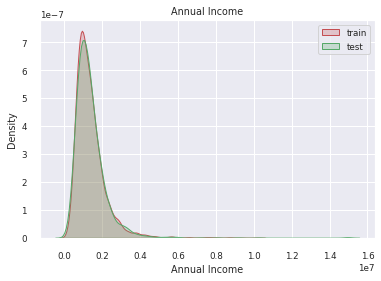

Tax Liens
MannwhitneyuResult(statistic=9336937.5, pvalue=0.09836860283803656)


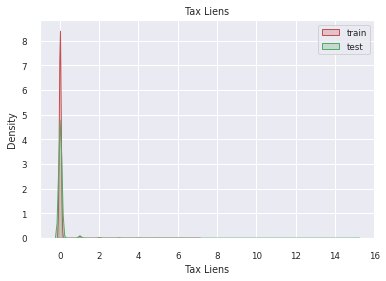

Number of Open Accounts
MannwhitneyuResult(statistic=9279311.5, pvalue=0.22142637178864455)


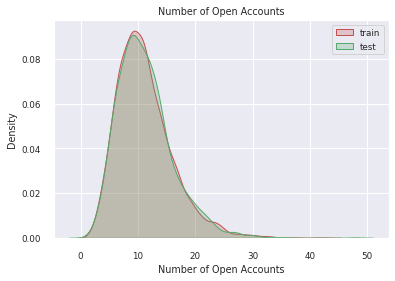

Years of Credit History
MannwhitneyuResult(statistic=9339658.0, pvalue=0.3886945952485082)


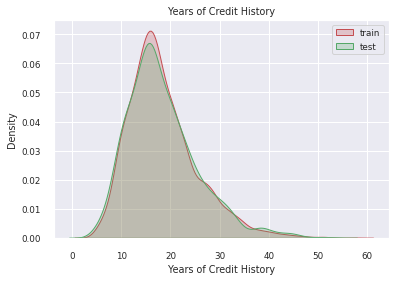

Maximum Open Credit
MannwhitneyuResult(statistic=9337869.0, pvalue=0.3832220993414893)


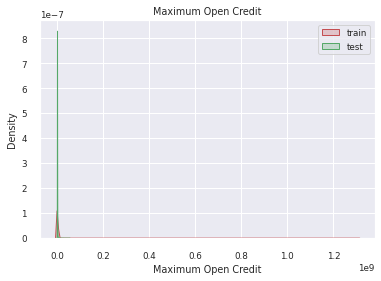

Number of Credit Problems
MannwhitneyuResult(statistic=9295513.5, pvalue=0.14195772552376257)


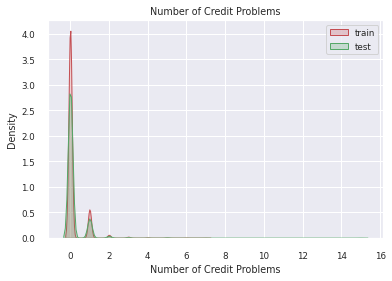

Months since last delinquent
MannwhitneyuResult(statistic=6974400.5, pvalue=1.712573746209761e-82)


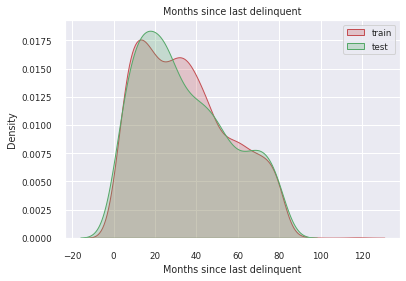

Bankruptcies
MannwhitneyuResult(statistic=9254231.0, pvalue=0.036681545859698156)


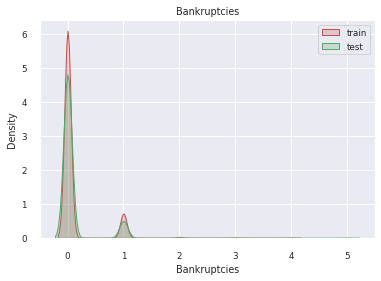

Current Loan Amount
MannwhitneyuResult(statistic=9230199.5, pvalue=0.12317435968682072)


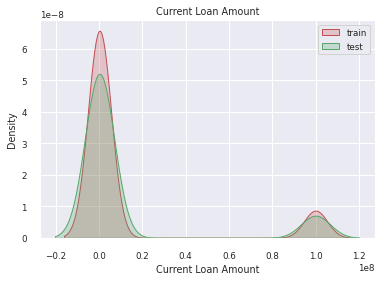

Current Credit Balance
MannwhitneyuResult(statistic=9334050.0, pvalue=0.3716147491364306)


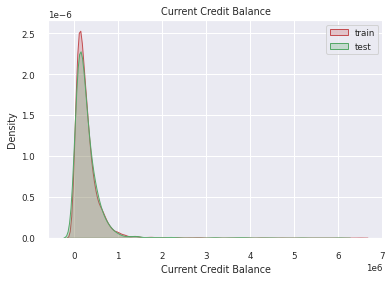

Monthly Debt
MannwhitneyuResult(statistic=9288187.0, pvalue=0.24369523330673137)


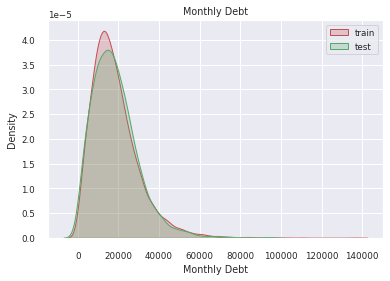

Credit Score
MannwhitneyuResult(statistic=9359581.5, pvalue=0.45091647518794764)


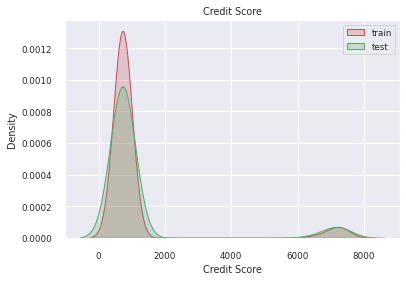

In [12]:
figsize = (6, 4)
for col in train_df.select_dtypes(include=['float64']).columns:
    plt.figure(figsize=figsize)
    sns.set(font_scale=0.8)
    sns.kdeplot(train_df[col], shade=True, label='train', color='r')
    sns.kdeplot(test_df[col], shade=True, label='test', color='g')
    print(col)
    print(mannwhitneyu(train_df[col], test_df[col]))
    plt.legend()
    plt.title(col)
    plt.show()

#### Проверим на похожесть категориальные признаки

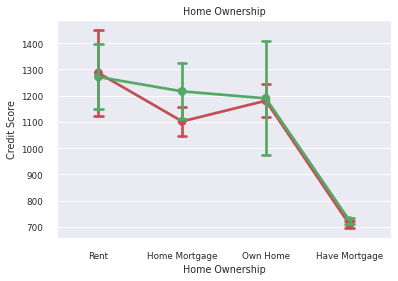

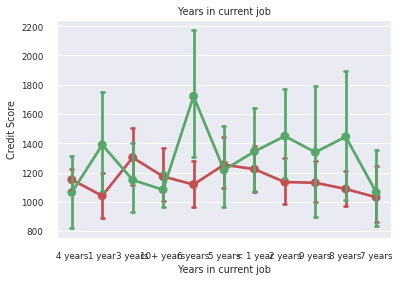

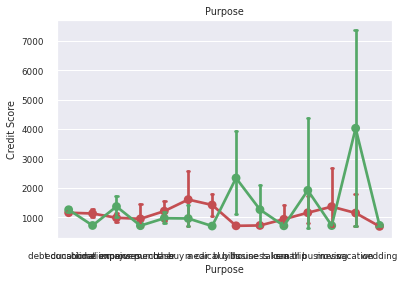

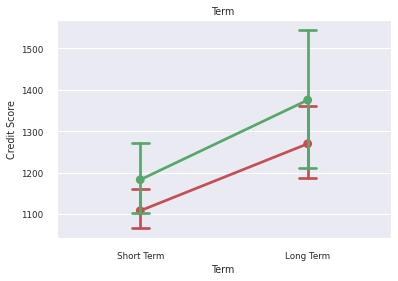

In [13]:
num_feature = 'Credit Score'
for col in train_df.select_dtypes(include=['object']).columns:
    plt.figure(figsize=figsize)
    sns.pointplot(x=col, y=num_feature, data=train_df, capsize=.1, label='train', color='r')
    sns.pointplot(x=col, y=num_feature, data=test_df, capsize=.1, label='test', color='g')
    plt.title(col) 
    plt.show()

## 4. Обработка выбросов и пропусков <a class='anchor' id='out_nan'>

### 4.1 Вещественные признаки <a class='anchor' id='out_nan_def'>

**Annual Income**

In [14]:
quantile_995_AI = train_df['Annual Income'].quantile(0.995)
train_df.loc[train_df['Annual Income'] > quantile_995_AI, 'Annual Income'] = quantile_995_AI

train_df['Annual Income'].fillna(0.0, inplace=True)

**Maximum Open Credit**


In [15]:
quantile_995_MOC = train_df['Maximum Open Credit'].quantile(0.995)
train_df.loc[train_df['Maximum Open Credit'] > quantile_995_MOC, 'Maximum Open Credit'] = quantile_995_MOC

**Current Loan Amount**

In [16]:
train_df.loc[train_df['Current Loan Amount'] > 99999999, 'Current Loan Amount'] = train_df['Current Loan Amount'].median()

**Current Credit Balance**

In [17]:
quantile_975_CCB = train_df['Current Credit Balance'].quantile(0.975)
train_df.loc[train_df['Current Credit Balance'] > quantile_975_CCB, 'Current Credit Balance'] = train_df['Current Credit Balance'].median()

**Credit Score**

In [18]:
train_df.loc[train_df['Credit Score'] > 800, 'Credit Score'] = train_df['Credit Score'] / 10

train_df.loc[train_df['Credit Score'].isna(), 'Credit Score'] = train_df['Credit Score'].median()

**Years in current job**

In [19]:
train_df['Years in current job'].fillna('3 years', inplace=True)

**Bankruptcies**

In [20]:
train_df.loc[train_df['Bankruptcies'] >= 3, 'Bankruptcies'] = 3

### 4.2 Категориальные признаки <a class='anchor' id='out_nan_mat'>

**Home Ownership**

In [21]:
train_df.loc[train_df['Home Ownership'] == 'Have Mortgage', 'Home Ownership'] = 'Home Mortgage'

train_df['Home Ownership'].fillna('Rent', inplace=True)

## 5. Генерация признаков <a class='anchor' id='feature_eng'>

**Years in current job**

In [22]:
year_dict = {
    '< 1 year': 0,
    '1 year': 1,
    '2 years': 2,
    '3 years': 3,
    '4 years': 4,
    '5 years': 5,
    '6 years': 6,
    '7 years': 7,
    '8 years': 8,
    '9 years': 9,
    '10+ years': 10
}

train_df['Years in current job'].replace(year_dict, inplace=True)

**Term**

In [23]:
train_df['Term'].replace({'Short Term': 0, 'Long Term': 1}, inplace=True)

## 6. Классы подготовки данных <a class='anchor' id='data_prepare'>

In [24]:
class DataPreprocessing:
    """Подготовка исходных данных"""
    
    def __init__(self):
        """Параметры класса"""
        
        self.medians = None
        self.quantile_995_AI = None
        self.quantile_995_MOC = None
        self.quantile_975_CCB = None
        
        
    def fit(self, X):
        """Сохранение статистик"""

        X = X.copy()        
        self.medians = X.median()

        self.quantile_995_AI = X['Annual Income'].quantile(0.995)

        self.quantile_995_MOC = X['Maximum Open Credit'].quantile(0.995)

        self.quantile_975_CCB = X['Current Credit Balance'].quantile(0.975)

        
    def transform(self, X):
        """Трансформация данных"""
        
        X['TooBigLoanAmount'] = 1 * (X['Current Loan Amount'] > 9999999.0)
        
        X.loc[X['Purpose'] == 'buy a car', 'Purpose'] = 'other'
        X.loc[X['Purpose'] == 'buy house', 'Purpose'] = 'other'
        X.loc[X['Purpose'] == 'home improvements', 'Purpose'] = 'other'
        X.loc[X['Purpose'] == 'renewable energy', 'Purpose'] = 'other'

        # Annual Income
        X.loc[X['Annual Income'] > self.quantile_995_AI, 'Annual Income'] = self.quantile_995_AI
        X['Annual Income'].fillna(0.0, inplace=True)

        # Maximum Open Credit
        X.loc[X['Maximum Open Credit'] > self.quantile_995_MOC, 'Maximum Open Credit'] = self.quantile_995_MOC
        # Если Maximum Open Credit = 0, то заменим его на Current Loan Amount
        X.loc[(X['Maximum Open Credit'] == 0),'Maximum Open Credit'] = X['Current Loan Amount']

        # Current Loan Amount
        X.loc[X['Current Loan Amount'] > 99999999, 'Current Loan Amount'] = X['Current Loan Amount'].median()

        # Current Credit Balance
        X.loc[X['Current Credit Balance'] > self.quantile_975_CCB, 'Current Credit Balance'] = X['Current Credit Balance'].median()

        # Credit Score
        X.loc[X['Credit Score'] > 800, 'Credit Score'] = X['Credit Score'] / 10

        # Ownership
        X.loc[X['Home Ownership'] == 'Have Mortgage', 'Home Ownership'] = 'Home Mortgage'

        # Years in current job
        X.loc[X['Years in current job'].isna(), 'Years in current job'] = X['Years in current job'].mode()[0]

        # Months since last delinquent
        X.loc[X['Months since last delinquent'].isna(), 'Months since last delinquent'] = 0

        # Bankruptcies
        X.loc[X['Bankruptcies'].isna(), 'Bankruptcies'] = X['Bankruptcies'].median()
        
        # Credit Score
        X.loc[X['Credit Score'].isna(), 'Credit Score'] = X['Credit Score'].median()
        
        X.fillna(self.medians, inplace=True)
        
        return X

In [25]:
class FeatureGenetator():
    """Генерация новых фич"""
    
    def __init__(self):
        self.year_dict = None
        self.term_dict = None
    
    def fit(self, X, y=None):
        
        X = X.copy()
        
        # Feature encoding
        self.year_dict = {
            '< 1 year': 0,
            '1 year': 1,
            '2 years': 2,
            '3 years': 3,
            '4 years': 4,
            '5 years': 5,
            '6 years': 6,
            '7 years': 7,
            '8 years': 8,
            '9 years': 9,
            '10+ years': 10
        }
        
        self.term_dict = {
            'Short Term': 0,
            'Long Term': 1
        }
      
    def transform(self, X):

        # Переведем категориальный признак Years in current job в вещественный
        X['Years in current job'].replace(self.year_dict, inplace=True)
        
        # Переведем признак Bankruptcies в бинарный - есть факт банкротства или нет
        X.loc[X['Bankruptcies'] > 0, 'Bankruptcies'] = 1
        
        # Переведем категориальный признак Term в бинарный признак
        X['Term'].replace(self.term_dict, inplace=True)
        
        # Dummy features
        X = pd.concat([X, pd.get_dummies(X['Home Ownership'])], axis=1)
        
        #Удаление ненужных признаков
        X.drop('Home Ownership', axis=1, inplace=True)
        X.drop('Purpose', axis=1, inplace=True)
        #X.drop('Term', axis=1, inplace=True)
        
        return X        

## 7. Разбиение на train и test <a class='anchor' id='split'>

In [26]:
feature_names = ['Annual Income', 'Years in current job', 'Tax Liens', 'Number of Open Accounts',
                 'Years of Credit History', 'Maximum Open Credit', 'Number of Credit Problems',
                 'Months since last delinquent', 'Bankruptcies', 'Current Loan Amount',
                 'Current Credit Balance', 'Monthly Debt', 'Credit Score',
                ]


target_name = 'Credit Default'

In [27]:
df_train = pd.read_csv(TRAIN_DATASET_PATH)
df_test = pd.read_csv(TEST_DATASET_PATH)

X = df_train.drop(columns=target_name)
y = df_train[target_name]

X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.33, shuffle=True, random_state=42)

preprocessor = DataPreprocessing()
preprocessor.fit(X_train)

X_train = preprocessor.transform(X_train)
X_valid = preprocessor.transform(X_valid)
df_test = preprocessor.transform(df_test)

features_gen = FeatureGenetator()
features_gen.fit(X_train, y_train)

X_train = features_gen.transform(X_train)
X_valid = features_gen.transform(X_valid)
df_test = features_gen.transform(df_test)

In [28]:
X_train = X_train[feature_names + new_feature_names]
X_valid = X_valid[feature_names + new_feature_names]
df_test = df_test[feature_names + new_feature_names]

NameError: name 'new_feature_names' is not defined

In [29]:
disbalance = y_train.value_counts()[0] / y_train.value_counts()[1]
disbalance

2.604734576757532

## 8. Построение модели <a class='anchor' id='modeling'>

In [30]:
model_catb = catb.CatBoostClassifier(
                                     silent=True, 
                                     random_state=42,
                                     class_weights=[1, disbalance],
                                     eval_metric='F1',
                                     early_stopping_rounds=20,
                                     use_best_model=True,
                                     custom_metric=['Precision', 'Recall'],
                                     iterations=50,
                                     max_depth=3,
                                     min_data_in_leaf=5
                                    )

model_catb.fit(X_train, y_train, plot=True, eval_set=(X_valid, y_valid))

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

In [31]:
evaluate_preds(model_catb, X_train, X_valid, y_train, y_valid)

TRAIN
 0.504
VALID
 0.509
TRAIN

              precision    recall  f1-score   support

           0       0.86      0.48      0.62      3631
           1       0.37      0.79      0.50      1394

    accuracy                           0.57      5025
   macro avg       0.61      0.64      0.56      5025
weighted avg       0.72      0.57      0.59      5025

VALID

              precision    recall  f1-score   support

           0       0.84      0.47      0.60      1756
           1       0.38      0.78      0.51       719

    accuracy                           0.56      2475
   macro avg       0.61      0.63      0.56      2475
weighted avg       0.71      0.56      0.58      2475

CONFUSION MATRIX

col_0             0    1
Credit Default          
0               824  932
1               155  564


## 9. Прогнозирование. натестовом датасете <a class='anchor' id='prediction'>

In [32]:
predictions = model_catb.predict(df_test)
predictions

array([1, 1, 1, ..., 0, 0, 1])

In [33]:
submit['Credit Default'] = predictions

NameError: name 'submit' is not defined

In [34]:
submit.to_csv('submit7.csv', index=False)

NameError: name 'submit' is not defined